In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Bias_correction_ucl.csv')

In [3]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
df.shape

(7752, 25)

In [5]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [7]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [8]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
dfcor=df.corr()
dfcor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.113211,0.132419,-0.067122,-0.168010,0.069561,0.105422,0.005320,-0.134226,0.006956,...,-0.008369,-0.012671,-0.010580,-0.237610,-0.118763,-0.255970,-0.090113,-0.019011,0.108306,0.128719
Present_Tmax,0.113211,1.000000,0.618760,-0.206782,-0.304209,0.575289,0.629247,-0.122876,0.136716,-0.314863,...,-0.100420,-0.121271,-0.101471,-0.052776,0.009075,-0.187855,-0.106097,-0.025557,0.613109,0.625252
Present_Tmin,0.132419,0.618760,1.000000,0.124921,-0.015334,0.470118,0.772921,-0.035111,-0.009368,0.085593,...,0.069095,-0.046645,-0.064394,-0.078715,-0.043725,-0.251257,-0.146736,0.053828,0.473868,0.799758
LDAPS_RHmin,-0.067122,-0.206782,0.124921,1.000000,0.579141,-0.564580,0.089476,0.294361,-0.070858,0.613818,...,0.390967,0.240642,0.168595,0.087523,-0.076608,0.102612,0.124346,0.244795,-0.442958,0.095830
LDAPS_RHmax,-0.168010,-0.304209,-0.015334,0.579141,1.000000,-0.373404,-0.114143,0.135333,0.238579,0.436652,...,0.229050,0.134607,0.117853,0.196751,0.025792,0.178031,0.220668,0.149699,-0.286478,-0.072490
LDAPS_Tmax_lapse,0.069561,0.575289,0.470118,-0.564580,-0.373404,1.000000,0.654021,-0.311996,0.048010,-0.438439,...,-0.242122,-0.188115,-0.160273,-0.042298,0.091107,-0.179766,-0.163123,0.048111,0.836144,0.591535
LDAPS_Tmin_lapse,0.105422,0.629247,0.772921,0.089476,-0.114143,0.654021,1.000000,-0.130035,-0.134761,0.010901,...,0.000870,-0.088575,-0.094655,-0.096726,-0.026831,-0.196407,-0.186753,0.160443,0.593195,0.886964
LDAPS_WS,0.005320,-0.122876,-0.035111,0.294361,0.135333,-0.311996,-0.130035,1.000000,0.006711,0.289445,...,0.191886,0.161684,0.144085,0.036836,-0.059756,0.191983,0.172464,0.122116,-0.346592,-0.097390
LDAPS_LH,-0.134226,0.136716,-0.009368,-0.070858,0.238579,0.048010,-0.134761,0.006711,1.000000,-0.147296,...,-0.077545,0.016102,0.019979,0.133870,0.025948,0.055402,0.087203,-0.047523,0.159324,-0.055895
LDAPS_CC1,0.006956,-0.314863,0.085593,0.613818,0.436652,-0.438439,0.010901,0.289445,-0.147296,1.000000,...,0.389453,0.168742,0.091722,-0.008170,-0.006876,-0.014159,-0.020853,0.218949,-0.457583,-0.011129


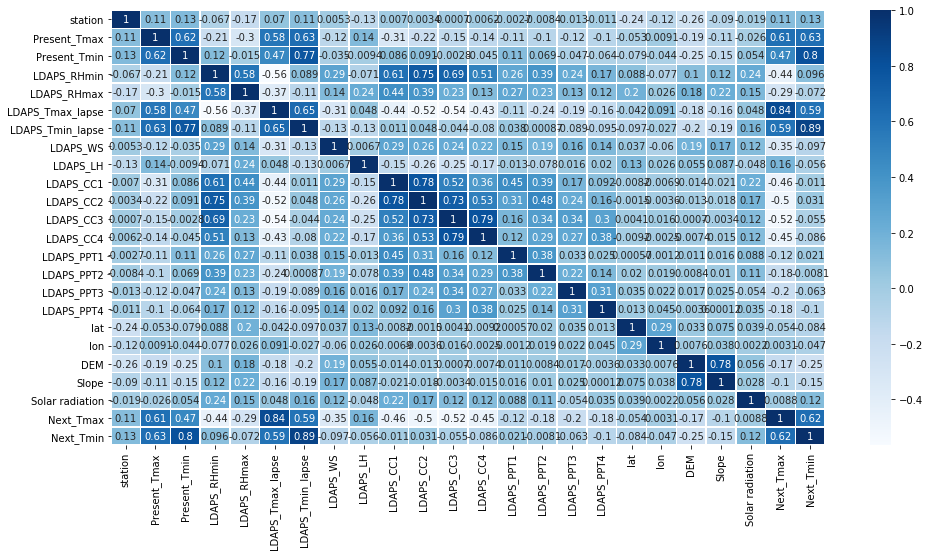

In [10]:
plt.figure(figsize = (16,8))
sns.heatmap(dfcor, cmap='Blues',annot=True,linewidths=0.5)

In [11]:
df['Date'].unique()

array(['2013-06-30', '2013-07-01', '2013-07-02', '2013-07-03',
       '2013-07-04', '2013-07-05', '2013-07-06', '2013-07-07',
       '2013-07-08', '2013-07-09', '2013-07-10', '2013-07-11',
       '2013-07-12', '2013-07-13', '2013-07-14', '2013-07-15',
       '2013-07-16', '2013-07-17', '2013-07-18', '2013-07-19',
       '2013-07-20', '2013-07-21', '2013-07-22', '2013-07-23',
       '2013-07-24', '2013-07-25', '2013-07-26', '2013-07-27',
       '2013-07-28', '2013-07-29', '2013-07-30', '2013-07-31',
       '2013-08-01', '2013-08-02', '2013-08-03', '2013-08-04',
       '2013-08-05', '2013-08-06', '2013-08-07', '2013-08-08',
       '2013-08-09', '2013-08-10', '2013-08-11', '2013-08-12',
       '2013-08-13', '2013-08-14', '2013-08-15', '2013-08-16',
       '2013-08-17', '2013-08-18', '2013-08-19', '2013-08-20',
       '2013-08-21', '2013-08-22', '2013-08-23', '2013-08-24',
       '2013-08-25', '2013-08-26', '2013-08-27', '2013-08-28',
       '2013-08-29', '2013-08-30', '2014-06-30', '2014-

In [12]:
df['Date']=pd.to_datetime(df['Date'])

In [13]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

In [14]:
mean=df['Present_Tmax'].mean()
mean

29.76821140328037

In [15]:
df['Present_Tmax'].fillna(mean,inplace=True)

In [16]:
mean=df['Present_Tmin'].mean()
mean

23.22505857849521

In [17]:
df['Present_Tmin'].fillna(mean,inplace=True)

In [18]:
mean=df['LDAPS_RHmin'].mean()
mean

56.75937215069287

In [19]:
df['LDAPS_RHmin'].fillna(mean,inplace=True)

In [20]:
mean=df['LDAPS_RHmax'].mean()
mean

88.37480388719037

In [21]:
df['LDAPS_RHmax'].fillna(mean,inplace=True)

In [22]:
mean=df['LDAPS_Tmax_lapse'].mean()
mean

29.613446542813577

In [23]:
df['LDAPS_Tmax_lapse'].fillna(mean,inplace=True)

In [24]:
mean=df['LDAPS_Tmin_lapse'].mean()
mean

23.512588776279873

In [25]:
df['LDAPS_Tmin_lapse'].fillna(mean,inplace=True)

In [26]:
mean=df['LDAPS_WS'].mean()
mean

7.097874569625358

In [27]:
df['LDAPS_WS'].fillna(mean,inplace=True)

In [28]:
mean=df['LDAPS_LH'].mean()
mean

62.505018909340585

In [29]:
df['LDAPS_LH'].fillna(mean,inplace=True)

In [30]:
mean=df['LDAPS_CC1'].mean()
mean

0.36877358559828194

In [31]:
df['LDAPS_CC1'].fillna(mean,inplace=True)

In [32]:
mean=df['LDAPS_CC2'].mean()
mean

0.35608043728396527

In [33]:
df['LDAPS_CC2'].fillna(mean,inplace=True)

In [34]:
mean=df['LDAPS_CC3'].mean()
mean

0.3184039558214151

In [35]:
df['LDAPS_CC3'].fillna(mean,inplace=True)

In [36]:
mean=df['LDAPS_CC4'].mean()
mean

0.29919138891453684

In [37]:
df['LDAPS_CC4'].fillna(mean,inplace=True)

In [38]:
mean=df['LDAPS_PPT1'].mean()
mean

0.5919945266984501

In [39]:
df['LDAPS_PPT1'].fillna(mean,inplace=True)

In [40]:
mean=df['LDAPS_PPT2'].mean()
mean

0.4850025590969125

In [41]:
df['LDAPS_PPT2'].fillna(mean,inplace=True)

In [42]:
mean=df['LDAPS_PPT3'].mean()
mean

0.2781996392747162

In [43]:
df['LDAPS_PPT3'].fillna(mean,inplace=True)

In [44]:
mean=df['LDAPS_PPT4'].mean()
mean

0.26940734997772564

In [45]:
df['LDAPS_PPT4'].fillna(mean,inplace=True)

In [46]:
mean=df['Next_Tmax'].mean()
mean 

30.274886731391593

In [47]:
df['Next_Tmax'].fillna(mean,inplace=True)

In [48]:
mean=df['Next_Tmin'].mean()
mean 

22.93222006472492

In [49]:
df['Next_Tmin'].fillna(mean,inplace=True)

In [50]:
df.isnull().sum()

station             2
Date                2
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [51]:
df.dropna(how='any',axis=0,inplace=True)

In [52]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

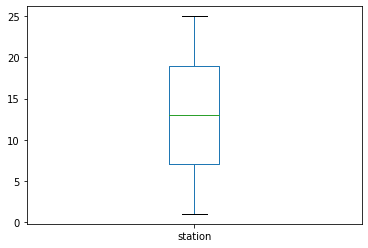

In [53]:
df['station'].plot.box()#no outliers exist here

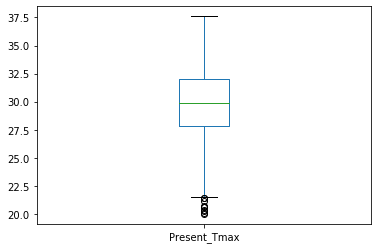

In [54]:
df['Present_Tmax'].plot.box()#outliers exist here

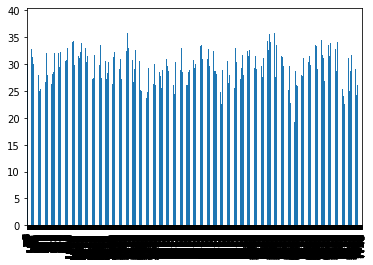

In [55]:
df['LDAPS_Tmax_lapse'].plot.bar()#even spread of data

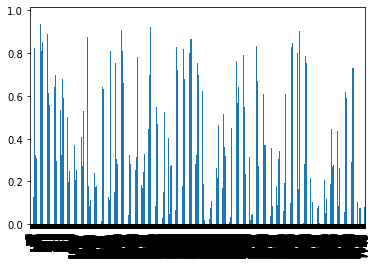

In [56]:
df['LDAPS_CC1'].plot.bar()#even spread of data

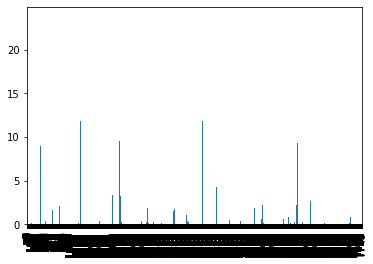

In [57]:
df['LDAPS_PPT1'].plot.bar()#even spread of data

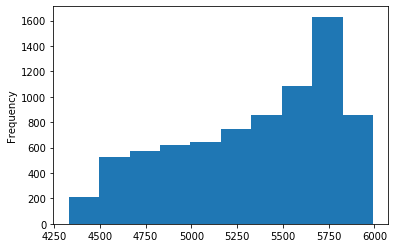

In [58]:
df['Solar radiation'].plot.hist()#data is left-skewed

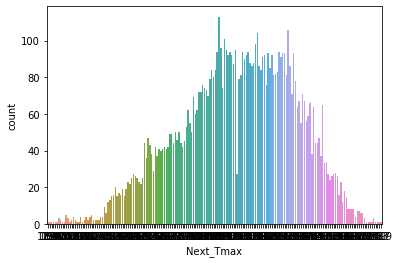

In [59]:
sns.countplot(df['Next_Tmax'])#even spread of data

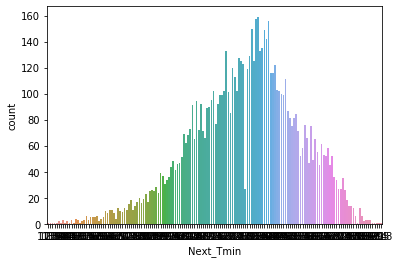

In [60]:
sns.countplot(df['Next_Tmin'])#even spread of data

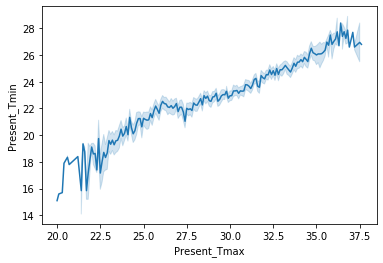

In [61]:
sns.lineplot(x='Present_Tmax',y='Present_Tmin',data=df)# highly dependent upon each other

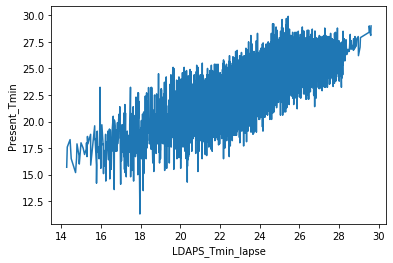

In [62]:
sns.lineplot(x='LDAPS_Tmin_lapse',y='Present_Tmin',data=df)# highly dependent upon each other

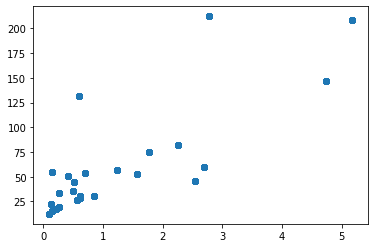

In [63]:
plt.scatter(df['Slope'],df['DEM'])# moderately dependent upon each other

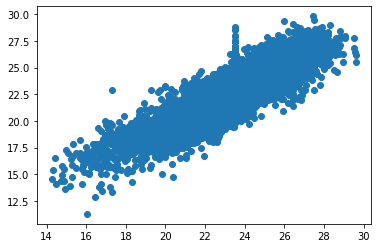

In [64]:
plt.scatter(df['LDAPS_Tmin_lapse'],df['Next_Tmin'])# highly dependent upon each other

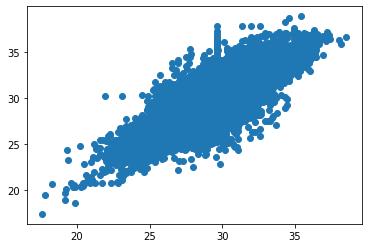

In [65]:
plt.scatter(df['LDAPS_Tmax_lapse'],df['Next_Tmax'])# highly dependent upon each other

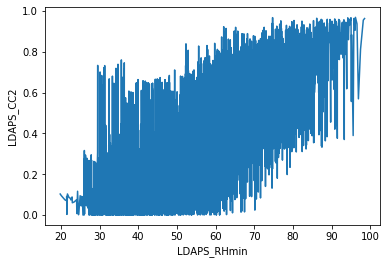

In [66]:
sns.lineplot(x='LDAPS_RHmin',y='LDAPS_CC2',data=df)# highly dependent upon each other

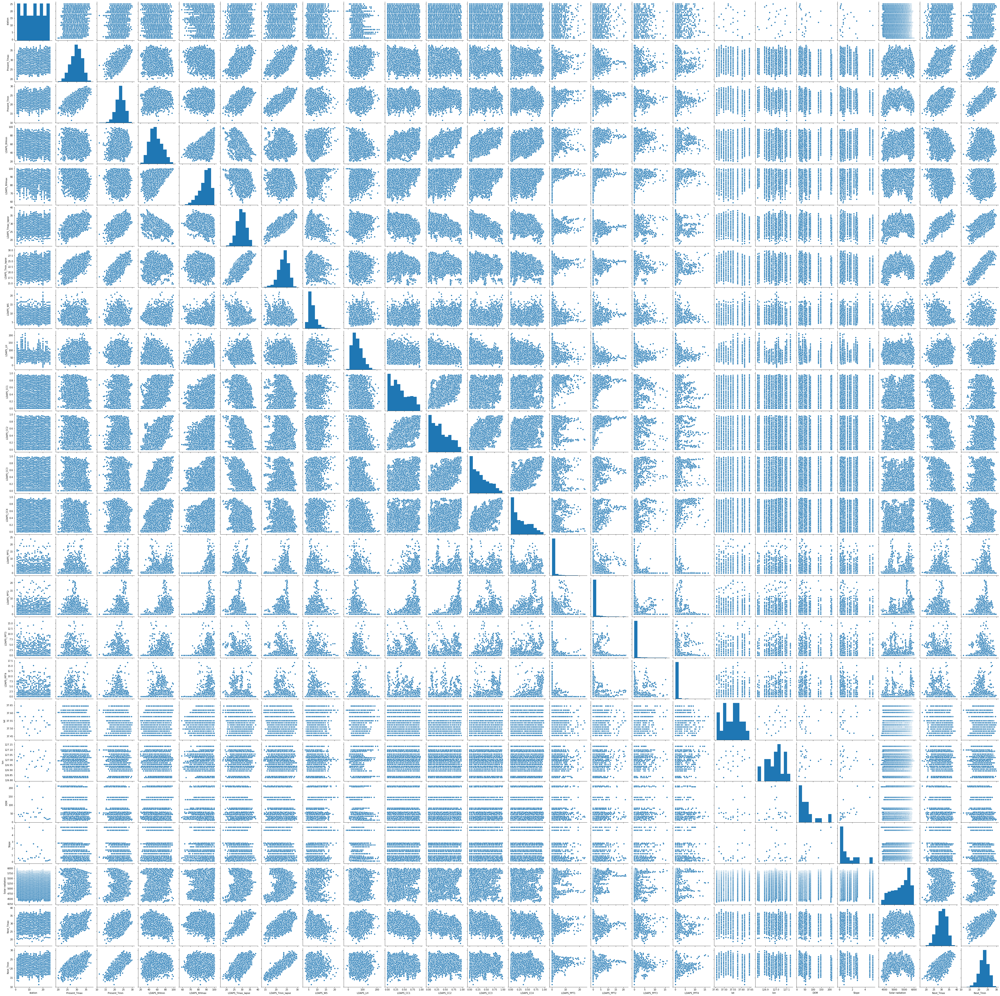

In [67]:
sns.pairplot(df)

station                AxesSubplot(0.125,0.749828;0.133621x0.130172)
Present_Tmax        AxesSubplot(0.285345,0.749828;0.133621x0.130172)
Present_Tmin         AxesSubplot(0.44569,0.749828;0.133621x0.130172)
LDAPS_RHmin         AxesSubplot(0.606034,0.749828;0.133621x0.130172)
LDAPS_RHmax         AxesSubplot(0.766379,0.749828;0.133621x0.130172)
LDAPS_Tmax_lapse       AxesSubplot(0.125,0.593621;0.133621x0.130172)
LDAPS_Tmin_lapse    AxesSubplot(0.285345,0.593621;0.133621x0.130172)
LDAPS_WS             AxesSubplot(0.44569,0.593621;0.133621x0.130172)
LDAPS_LH            AxesSubplot(0.606034,0.593621;0.133621x0.130172)
LDAPS_CC1           AxesSubplot(0.766379,0.593621;0.133621x0.130172)
LDAPS_CC2              AxesSubplot(0.125,0.437414;0.133621x0.130172)
LDAPS_CC3           AxesSubplot(0.285345,0.437414;0.133621x0.130172)
LDAPS_CC4            AxesSubplot(0.44569,0.437414;0.133621x0.130172)
LDAPS_PPT1          AxesSubplot(0.606034,0.437414;0.133621x0.130172)
LDAPS_PPT2          AxesSubplot(0.

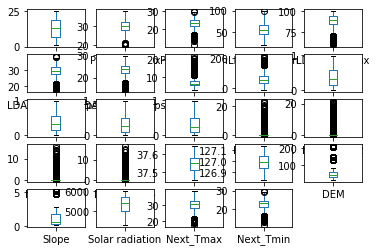

In [68]:
df.plot(kind='box',subplots=True,layout=(5,5))

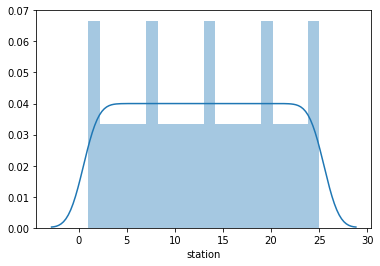

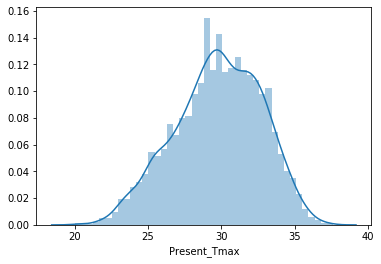

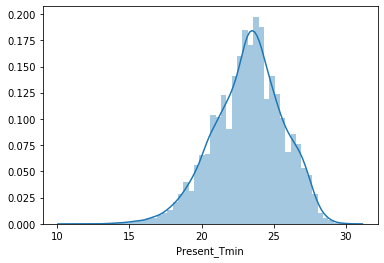

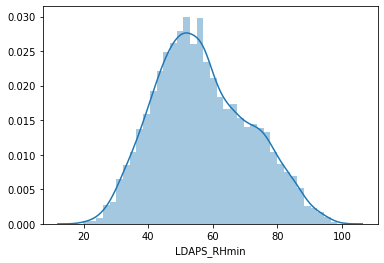

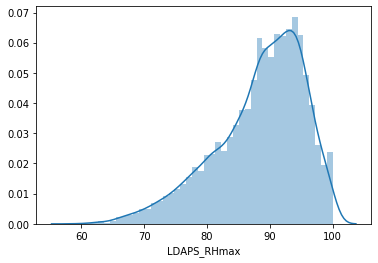

...

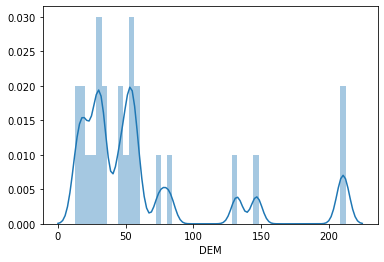

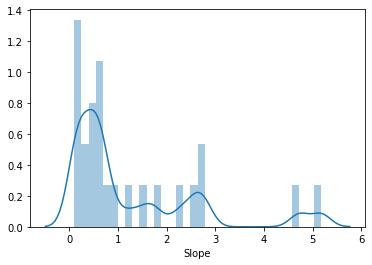

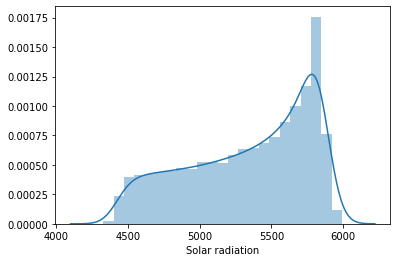

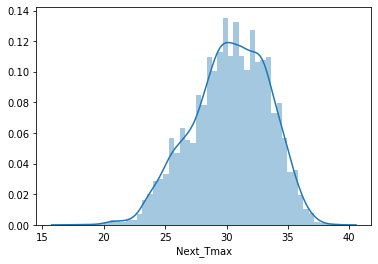

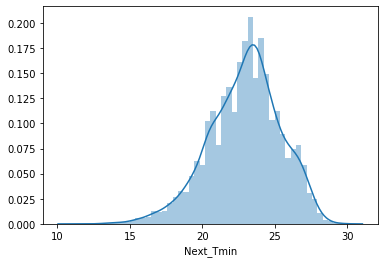

In [69]:
for i in df.describe().columns:
    sns.distplot(df[i])
    plt.show()

In [70]:
df.drop('Date',axis=1,inplace=True)

In [71]:
from scipy.stats import zscore#outliers are removed
z_score=abs(zscore(df))
print(df.shape)
df_new=df.loc[(z_score<3).all(axis=1)]
print(df_new.shape)

(7750, 24)
(6888, 24)


In [72]:
df_new.skew()

station             0.002824
Present_Tmax       -0.274048
Present_Tmin       -0.225739
LDAPS_RHmin         0.305363
LDAPS_RHmax        -0.687967
LDAPS_Tmax_lapse   -0.107947
LDAPS_Tmin_lapse   -0.382885
LDAPS_WS            1.088575
LDAPS_LH            0.569060
LDAPS_CC1           0.595343
LDAPS_CC2           0.501691
LDAPS_CC3           0.700518
LDAPS_CC4           0.711008
LDAPS_PPT1          3.723069
LDAPS_PPT2          4.859920
LDAPS_PPT3          5.479300
LDAPS_PPT4          5.926613
lat                 0.108039
lon                -0.275324
DEM                 1.765466
Slope               1.595105
Solar radiation    -0.505080
Next_Tmax          -0.268494
Next_Tmin          -0.238379
dtype: float64

In [73]:
LDAPS_WS_sqrt=np.sqrt(df_new['LDAPS_WS'])
LDAPS_WS_sqrt.skew()

0.7349811541925542

In [74]:
LDAPS_LH_sqrt=np.sqrt(df_new['LDAPS_LH'])
LDAPS_LH_sqrt.skew()

-0.004967789825890657

In [75]:
LDAPS_CC1_sqrt=np.sqrt(df_new['LDAPS_CC1'])
LDAPS_CC1_sqrt.skew()

-0.1749405117363722

In [76]:
LDAPS_CC3_sqrt=np.sqrt(df_new['LDAPS_CC3'])
LDAPS_CC3_sqrt.skew()

-0.10249784109132487

In [77]:
LDAPS_CC4_sqrt=np.sqrt(df_new['LDAPS_CC4'])
LDAPS_CC4_sqrt.skew()

0.0033714437835748634

In [78]:
LDAPS_PPT1_sqrt=np.sqrt(df_new['LDAPS_PPT1'])
LDAPS_PPT1_sqrt.skew()

2.3964242204920727

In [79]:
LDAPS_PPT2_sqrt=np.sqrt(df_new['LDAPS_PPT2'])
LDAPS_PPT2_sqrt.skew()

3.031073956625612

In [80]:
LDAPS_PPT3_sqrt=np.sqrt(df_new['LDAPS_PPT3'])
LDAPS_PPT3_sqrt.skew()

3.2546101528947746

In [81]:
LDAPS_PPT4_sqrt=np.sqrt(df_new['LDAPS_PPT4'])
LDAPS_PPT4_sqrt.skew()

3.5920467421135958

In [82]:
DEM_sqrt=np.sqrt(df_new['DEM'])
DEM_sqrt.skew()

1.1743396993682327

In [83]:
Slope_sqrt=np.sqrt(df_new['Slope'])
Slope_sqrt.skew()

0.8837828068493178

In [84]:
#seperating my input and output variables
x=df_new.iloc[:,0:-2]
x.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246


In [85]:
y=df_new.iloc[:,-2:]
y.head()

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5


In [86]:
y.shape

(6888, 2)

In [88]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(df_new)
x=pd.DataFrame(x,columns=df_new.columns)

In [89]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=52,test_size=0.28)

In [90]:
y_train.shape,y_test.shape

((4959, 2), (1929, 2))

In [91]:
x_train.shape,x_test.shape

((4959, 24), (1929, 24))

In [92]:
import sklearn
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
lm = LinearRegression()
def maxr2_score(lm,x,y):
    max_r_score=0
    for r_state in range(42,101):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=r_state,test_size=0.24)
        lm=LinearRegression()
        lm.fit(x_train,y_train)
        y_pred=lm.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print('r2_score corresponding to random state; ',r_state,' is: ',r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state

    print('max r2 score corresponding to ',final_r_state,' is ',max_r_score)
maxr2_score(lm, x,y)

r2_score corresponding to random state;  42  is:  1.0
r2_score corresponding to random state;  43  is:  1.0
r2_score corresponding to random state;  44  is:  1.0
r2_score corresponding to random state;  45  is:  1.0
r2_score corresponding to random state;  46  is:  1.0
r2_score corresponding to random state;  47  is:  1.0
r2_score corresponding to random state;  48  is:  1.0
r2_score corresponding to random state;  49  is:  1.0
r2_score corresponding to random state;  50  is:  1.0
r2_score corresponding to random state;  51  is:  1.0
r2_score corresponding to random state;  52  is:  1.0
r2_score corresponding to random state;  53  is:  1.0
r2_score corresponding to random state;  54  is:  1.0
r2_score corresponding to random state;  55  is:  1.0
r2_score corresponding to random state;  56  is:  1.0
r2_score corresponding to random state;  57  is:  1.0
r2_score corresponding to random state;  58  is:  1.0
r2_score corresponding to random state;  59  is:  1.0
r2_score corresponding to ra

In [93]:
#final model
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=80,test_size=0.20)
lm=linear_model.LinearRegression()
lm.fit(x_train,y_train)
y_pred=lm.predict(x_test)

In [94]:
#using cross validation to check over/under fitting
from sklearn.model_selection import cross_val_score
a_score=cross_val_score(linear_model.LinearRegression(),x,y,cv=5,scoring="r2")
a_score

array([1., 1., 1., 1., 1.])

In [95]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
print('RMSE is: ',np.sqrt(mean_squared_error(y_test,y_pred)))
print('r2_score: ',r2_score(y_test,y_pred))

RMSE is:  4.2362397113214316e-15
r2_score:  1.0


In [98]:
#saving the model
from sklearn.externals import joblib
filename='temperaturemin_maxfile.obj'

In [99]:
joblib.dump(lm,'temperaturemin_maxfile.obj')

['temperaturemin_maxfile.obj']